# Automated remote sensing with Python

## Python for remote sensing

* **numpy**: scientific computing,
* **matplotlib**: plotting figures and images,
* **pandas**: analysing tabular data,
* **psycopg2**: querying a Postgres database,
* **rasterio**: reading and writing rasters,
* **fiona**: reading and writing shapefiles,
* **scikit-learn**: machine learning,
* **jupyter notebook**: interactive data analysis.

## Load Landsat data

In [1]:
import numpy as np
import rasterio

Bands data are loaded as Numpy arrays. We save the profile to store informations about the main raster (data type, number of rows, number of columns, coordinates system reference, etc.). It will be useful for creating new rasters based on this one.

In [2]:
with rasterio.open('data/LC81950512015354LGN00_B2.TIF') as src:
    blue = src.read(1)
    profile = src.profile

In [3]:
with rasterio.open('data/LC81950512015354LGN00_B3.TIF') as src:
    red = src.read(1)

In [4]:
with rasterio.open('data/LC81950512015354LGN00_B4.TIF') as src:
    green = src.read(1)

In [5]:
with rasterio.open('data/LC81950512015354LGN00_B5.TIF') as src:
    nir = src.read(1)

In [6]:
with rasterio.open('data/LC81950512015354LGN00_B6.TIF') as src:
    swir = src.read(1)

### Plot images

Matplotlib can plot greyscale images (2D data) as well as RGB images.

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

/home/yann/.local/anaconda/envs/maupp/lib/python3.5/site-packages/matplotlib/__init__.py:508: UserWarning: matplotlibrc text.usetex can not be used unless ghostscript-7.07 or later is installed on your system
  'installed on your system') % gs_req)


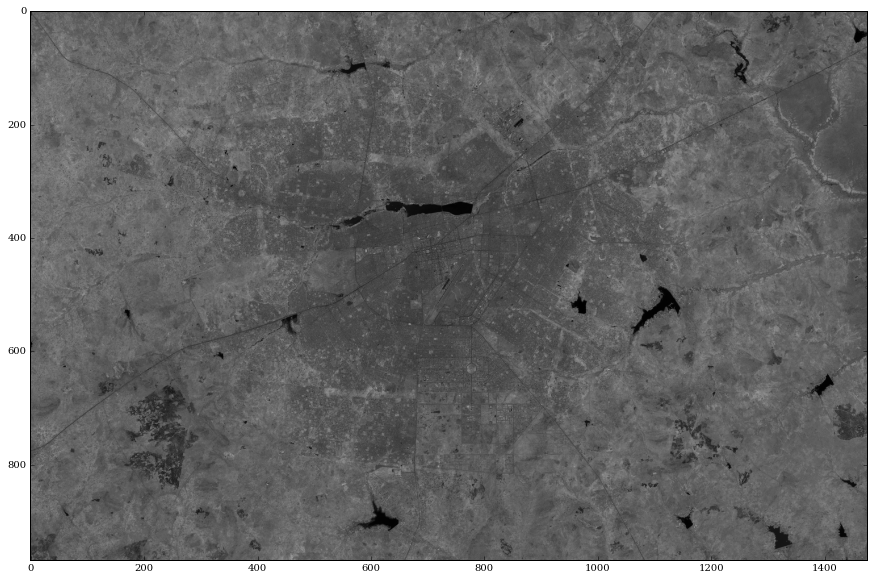

In [8]:
plt.figure(figsize=(15, 15))
plt.imshow(nir, cmap='gray')

## Histogram equalization

In [9]:
minimum = np.percentile(nir.ravel(), 4)
maximum = np.percentile(nir.ravel(), 96)
print(minimum, maximum)

2218.0 3796.0


In [10]:
nir_equalized = nir.copy()
nir_equalized[nir_equalized < minimum] = minimum
nir_equalized[nir_equalized > maximum] = maximum

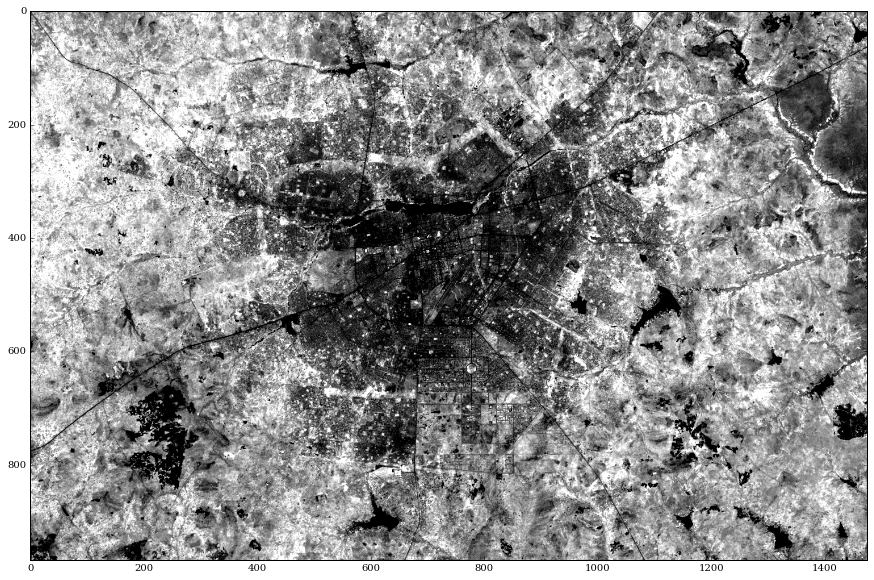

In [11]:
plt.figure(figsize=(15, 15))
plt.imshow(nir_equalized, cmap='gray')

In [12]:
def equalize(data, percent):
    minimum = np.percentile(data.ravel(), percent)
    maximum = np.percentile(data.ravel(), 100 - percent)
    equalized_data = data.copy()
    equalized_data[equalized_data < minimum] = minimum
    equalized_data[equalized_data > maximum] = maximum
    return equalized_data

## Spectral indices

In remote sensing, spectral indices are a combination of multiple bands that can indicate relative abundance of a feature of interest, such as vegetated or built areas.

### NDVI

$NDVI = \frac{NIR - Red}{NIR + Red}$

In [13]:
ndvi = (nir - red) / (nir + red)

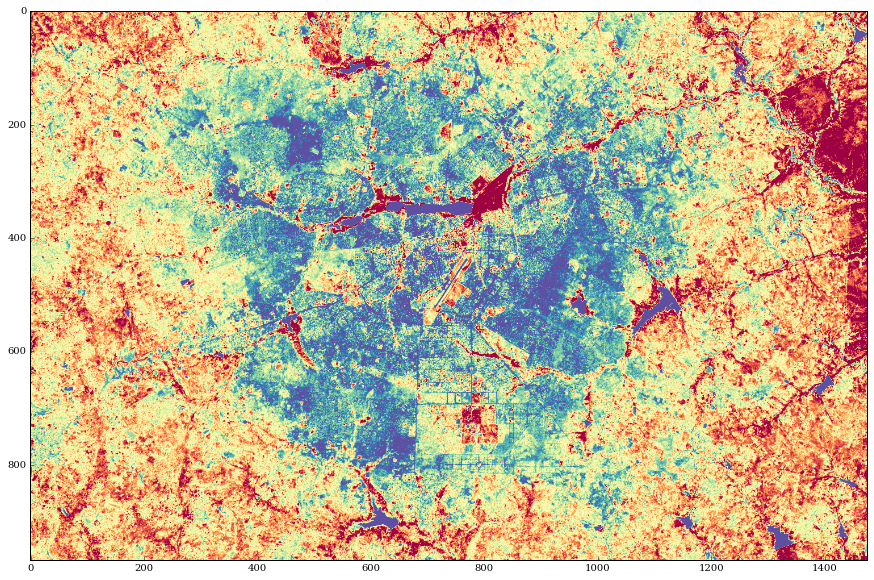

In [14]:
plt.figure(figsize=(15, 15))
plt.imshow(equalize(ndvi, 4), cmap='Spectral_r')

### NDBI

$NDBI = \frac{SWIR - NIR}{SWIR + NIR}$

In [15]:
ndbi = (swir - nir) + (swir + nir)

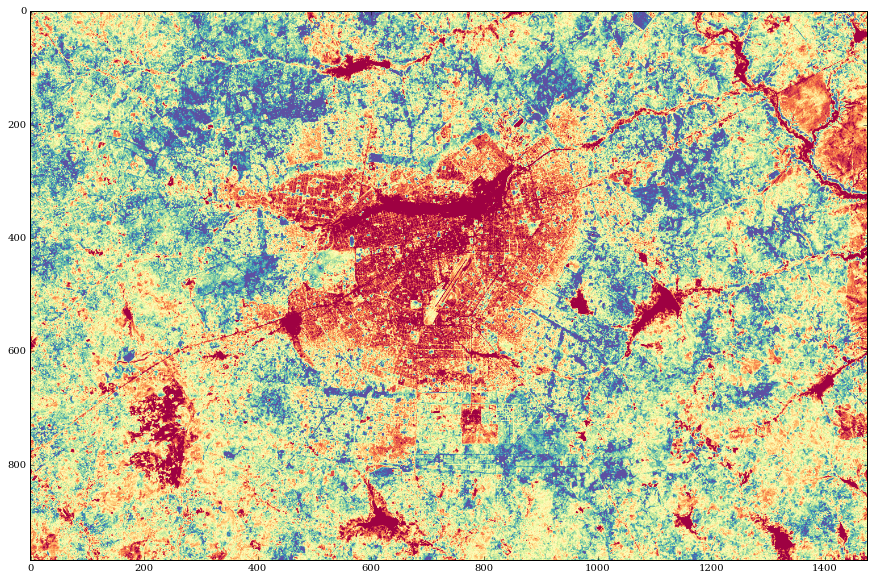

In [16]:
plt.figure(figsize=(15, 15))
plt.imshow(equalize(ndbi, 4), cmap='Spectral')

## Load OpenStreetMap buildings

In [17]:
import psycopg2 as pg
import pandas as pd
import json

In that case, OpenStreetMap data are stored in a local PostGIS database.

In [18]:
db = pg.connect(database='maupp', user='maupp', password='maupp', host='localhost')

### Query the PostGIS database

Rasterio and Fiona libraries supports geometries expressed as GeoJSON-like dictionnaries.

#### Get buildings

In [19]:
query = """
SELECT ST_AsGeoJSON(way) AS geometry, ST_Area(way) AS surface \
FROM osm_polygon \
WHERE building = 'yes'
"""

In [20]:
buildings_shapes = pd.read_sql(query, db)

In [21]:
surface_threshold = np.percentile(buildings_shapes.surface, 90)
buildings_shapes = buildings_shapes[buildings_shapes.surface >= surface_threshold]

In [22]:
buildings_shapes['geometry'] = [json.loads(geom) for geom in buildings_shapes.geometry]

#### Get non-built features

In [23]:
query = """
SELECT ST_AsGeoJSON(way) AS geometry, ST_Area(way) AS surface \
FROM osm_polygon \
WHERE landuse IN ('forest', 'farmland', 'farmyard') \
OR leisure IN ('garden', 'park') \
OR "natural" IN ('wetland', 'wood', 'scrub') \
"""

In [24]:
nonbuilt_shapes = pd.read_sql(query, db)

In [25]:
surface_threshold = np.percentile(nonbuilt_shapes.surface, 10)
nonbuilt_shapes = nonbuilt_shapes[nonbuilt_shapes.surface >= surface_threshold]

In [26]:
nonbuilt_shapes['geometry'] = [json.loads(geom) for geom in nonbuilt_shapes.geometry]

### Rasterize

Here, the rasterization process is kept simple: if the center of a raster cell intersects a vector shape, then it is burned (value = 1), else not (value = 0).

In [27]:
from rasterio.features import rasterize

In [28]:
buildings = rasterize(shapes=buildings_shapes.geometry.values,
                      out_shape=nir.shape,
                      transform=profile['affine'])

In [29]:
nonbuilt = rasterize(shapes=nonbuilt_shapes.geometry.values,
                      out_shape=nir.shape,
                      transform=profile['affine'])

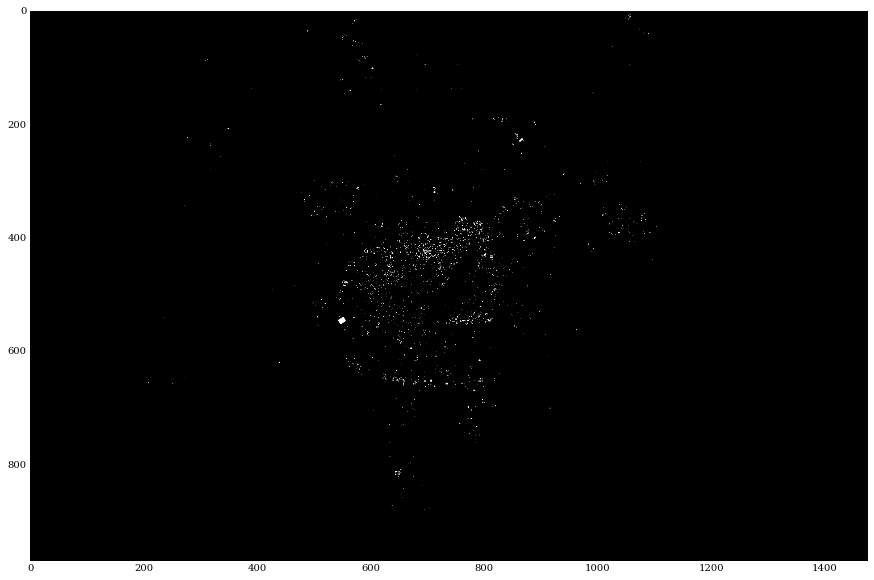

In [30]:
plt.figure(figsize=(15, 15))
plt.imshow(buildings, cmap='gray')

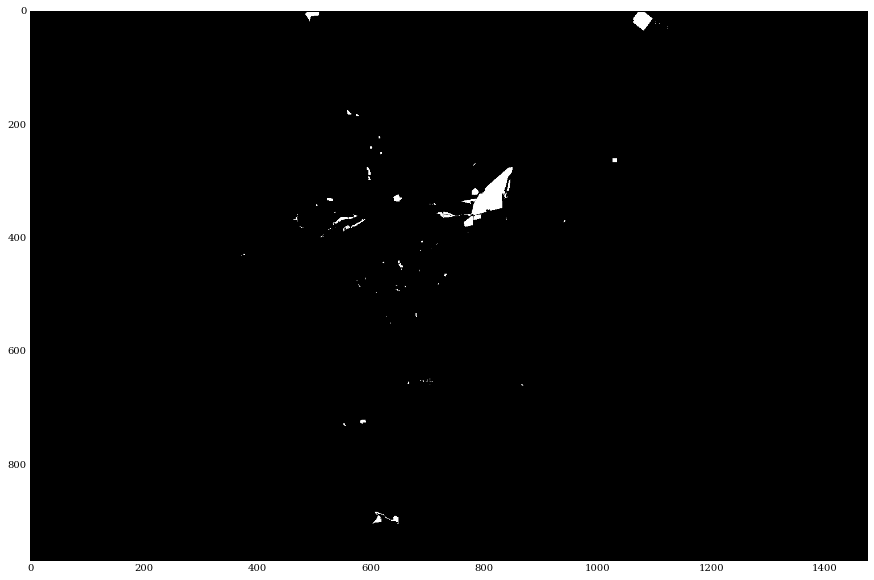

In [31]:
plt.figure(figsize=(15, 15))
plt.imshow(nonbuilt, cmap='gray')

## Clustering

Unsupervised learning.

In [32]:
from sklearn.cluster import KMeans, MeanShift

In [33]:
X = np.zeros(shape=(profile['height'] * profile['width'], 5))

In [34]:
for band_number, band_data in enumerate([blue, red, green, nir, swir]):
    X[:, band_number] = band_data.ravel()

In [35]:
clusterer = KMeans(n_clusters=8, n_jobs=-1)

In [36]:
clusters = clusterer.fit_predict(X)

### Visualize result

In [37]:
clusters = clusters.reshape(profile['height'], profile['width'])

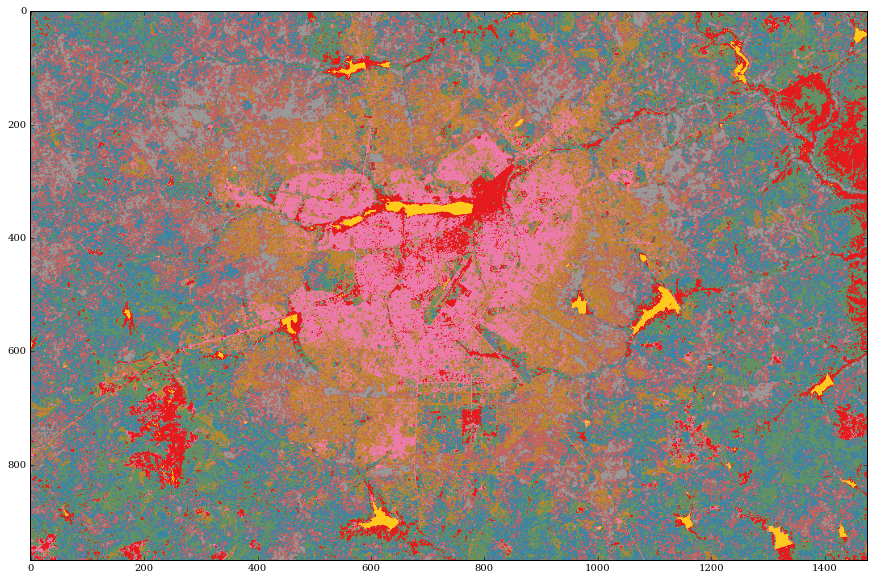

In [38]:
plt.figure(figsize=(15, 15))
plt.imshow(clusters, cmap='Set1')
groups = np.unique(clusterer.labels_)

## Classification

Supervised learning.

In [39]:
from sklearn.ensemble import RandomForestClassifier

### Data to predict

In [40]:
X = np.zeros(shape=(profile['height'] * profile['width'], 5))

In [41]:
for band_number, band_data in enumerate([blue, red, green, nir, swir]):
    X[:, band_number] = band_data.ravel()

### Training data

In [42]:
training_data = np.zeros_like(clusters)
training_data[buildings == 1] = 1
training_data[nonbuilt == 1] = 2

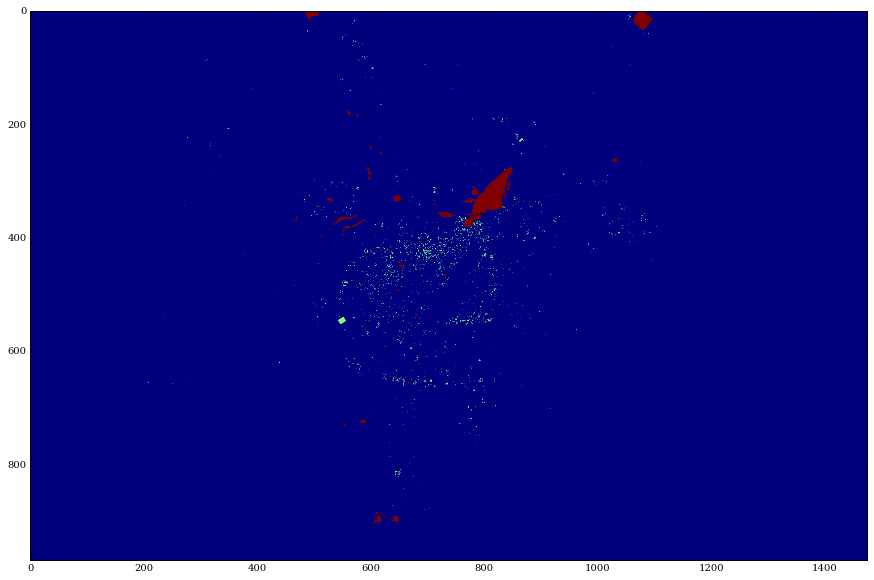

In [43]:
plt.figure(figsize=(15, 15))
plt.imshow(training_data)

In [44]:
nb_training_pixels = training_data[training_data != 0].shape[0]
X_train = np.zeros(shape=(nb_training_pixels, 5))

for band_number, band_data in enumerate([blue, red, green, nir, swir]):
    X_train[:, band_number] = band_data[training_data != 0]

In [45]:
y_train = training_data[training_data != 0]

### Run the model

In [46]:
classifier = RandomForestClassifier(n_jobs=-1)
classifier.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [47]:
classification = classifier.predict(X)

In [48]:
classification = classification.reshape(profile['height'], profile['width'])

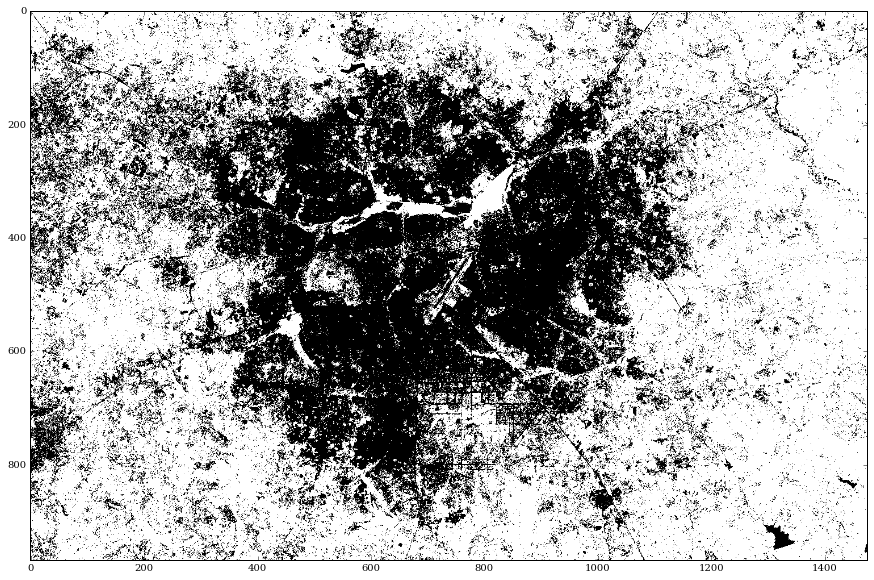

In [49]:
plt.figure(figsize=(15, 15))
plt.imshow(classification, cmap='gray')

In [50]:
probabilities = classifier.predict_log_proba(X)

In [51]:
probabilities = probabilities[:,0].reshape(profile['height'], profile['width'])

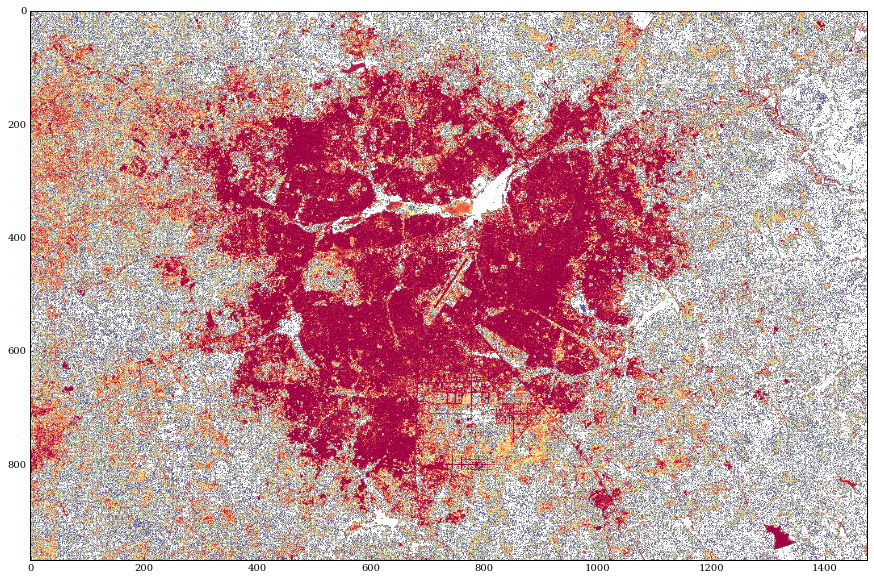

In [52]:
plt.figure(figsize=(15, 15))
plt.imshow(probabilities, cmap='Spectral_r')

## Post-processing

With moderate spatial resolution imagery, post-processing is usually necessary in order to improve the final result.

In [53]:
from scipy.ndimage.morphology import binary_opening

In [54]:
post_processed = classification.copy()
post_processed[post_processed == 2] = 0

In [55]:
post_processed = binary_opening(post_processed, iterations=2)

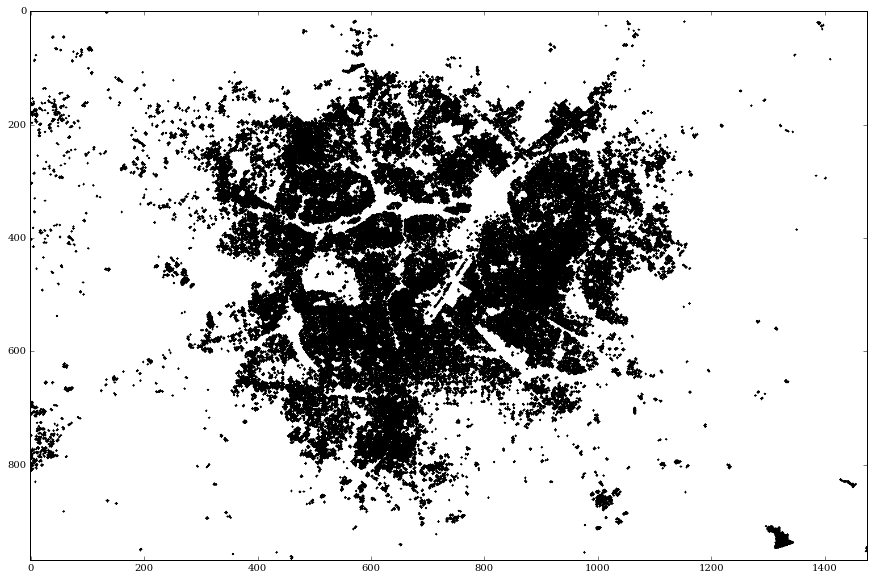

In [56]:
plt.figure(figsize=(15, 15))
plt.imshow(post_processed, cmap='gray_r')

## Save result

In [57]:
profile.update({'dtype': 'int16'})

In [58]:
with rasterio.open('data/output.tif', 'w', **profile) as output:
    output.write(post_processed.astype(np.int16), 1)

/home/yann/.local/anaconda/envs/maupp/lib/python3.5/site-packages/rasterio/__init__.py:160: FutureWarning: GDAL-style transforms are deprecated and will not be supported in Rasterio 1.0.
  transform = guard_transform(transform)


## Validation

In [59]:
import fiona

### Load & rasterize shapefiles

In [60]:
with fiona.open('data/built_validating.shp') as shapefile:
    built_true_shapes = [feature['geometry'] for feature in shapefile]

In [61]:
built_true = rasterize(shapes=built_true_shapes,
                       out_shape=nir.shape,
                       transform=profile['affine'])

built_true[built_true == 1].shape[0]

788

In [62]:
with fiona.open('data/nonbuilt_validating.shp') as shapefile:
    nonbuilt_true_shapes = [feature['geometry'] for feature in shapefile]

In [63]:
nonbuilt_true = rasterize(shapes=nonbuilt_true_shapes,
                          out_shape=nir.shape,
                          transform=profile['affine'])

nonbuilt_true[nonbuilt_true == 1].shape[0]

4897

In [64]:
test_data = np.zeros_like(classification)
test_data[built_true == 1] = 1
test_data[nonbuilt_true == 1] = 2

### Validation dataset

In [65]:
nb_test_pixels = test_data[test_data != 0].shape[0]
X_test = np.zeros(shape=(nb_test_pixels, 5))

for band_number, band_data in enumerate([blue, red, green, nir, swir]):
    X_test[:, band_number] = band_data[test_data != 0]

In [66]:
y_test = test_data[test_data != 0]

### Classification assessment

In [67]:
from sklearn.metrics import accuracy_score

In [68]:
y_pred = classifier.predict(X_test)

In [69]:
accuracy_score(y_test, y_pred)

0.73016710642040461

N.B. : in that case, the assessment procedure is applied without taking into account the post-processing step.